In [1]:
using CSV, DataFrames, StatsPlots, Plots.Measures

In [2]:
function readcounts(file::String)
    df = CSV.File(file, delim="\t") |> DataFrame
end

readcounts (generic function with 1 method)

In [4]:
fwdcounts = ones(Int, 364297)
revcounts = ones(Int, 364297)

for sample in ["Ph1", "Ph2", "Ph3", "PhF"]
    df = readcounts("phylloglossum_mitochondria_counts/$(sample)_rna_mitochondria_counts.tsv")
    fwdcounts .+= df.fA .+ df.fC .+ df.fG .+ df.fU
    revcounts .+= df.rA .+ df.rC .+ df.rG .+ df.rU
end

In [5]:
gff = CSV.File("Phylloglossum_drummondii_mitochondria.gff", delim="\t", comment="#", header=["genome","software","feature","start","stop","score","strand","phase","attributes"]) |> DataFrame

Row,genome,software,feature,start,stop,score,strand,phase,attributes
,String,String15,String15,Int64,Int64,String15,String1,String1,String
1,Phylloglossum_drummondii_mitochondria,Geneious,region,1,363297,.,+,0,Is_circular=true
2,Phylloglossum_drummondii_mitochondria,Pyrimid,misc_feature,4101,4101,7.16E-206,+,.,note=C to U RNA editing (frequency 0.83)
3,Phylloglossum_drummondii_mitochondria,Geneious,CDS,4441,4815,.,+,0,Name=rps12 CDS;codon_start=1
4,Phylloglossum_drummondii_mitochondria,Geneious,gene,4441,4815,.,+,.,Name=rps12 gene
5,Phylloglossum_drummondii_mitochondria,Pyrimid,misc_feature,4495,4495,1.34E-19,+,.,note=C to U RNA editing (frequency 0.23)
6,Phylloglossum_drummondii_mitochondria,Pyrimid,misc_feature,4614,4614,1.42E-319,+,.,note=C to U RNA editing (frequency 0.76)
7,Phylloglossum_drummondii_mitochondria,Pyrimid,misc_feature,4661,4661,.,+,.,note=C to U RNA editing (frequency 0.78)
8,Phylloglossum_drummondii_mitochondria,Pyrimid,misc_feature,5183,5183,1.53E-92,+,.,note=C to U RNA editing (frequency 0.37)
9,Phylloglossum_drummondii_mitochondria,Pyrimid,misc_feature,5647,5647,4.23E-13,+,.,note=C to U RNA editing (frequency 0.20)


In [6]:
default(fontfamily = "Helvetica", guidefontfamily = "Helvetica Bold", size=(1200,300), legend = false, xformatter = :plain)

# define a function that returns a Plots.Shape
rectangle(w, h, x, y) = Shape(x .+ [0,w,w,0], y .+ [0,0,h,h])

rectangle (generic function with 1 method)

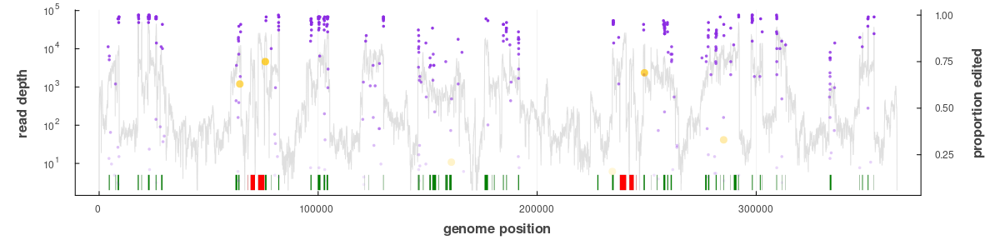

In [15]:
plot(fwdcounts .+ revcounts, color = :silver, alpha = 0.5, xguide = "genome position", yguide="read depth", yticks=[1,10,100,1000,1e4,1e5,1e6,1e7], yscale = :log10)

cds = filter(x->x.feature == "CDS", gff)
for exon in eachrow(cds)
    plot!(rectangle(exon.stop - exon.start, 3, exon.start, 2), color=:green, lw=0)
end

cds = filter(x->x.feature == "rRNA", gff)
for exon in eachrow(cds)
    plot!(rectangle(exon.stop - exon.start, 3, exon.start, 2), color=:red, lw=0)
end

esites = filter(x->occursin("RNA editing", x.attributes), gff)
sitepos = Int[]
editp = Float64[]
cpalette = :rainbow
colors = Int[]
mss = Int[]
for exon in eachrow(esites)
    push!(sitepos, exon.start)
    push!(editp, parse(Float64, exon.attributes[36:39]))
    push!(colors, exon.attributes[6] == 'C' ? 4 : 5)
    push!(mss, exon.attributes[6] == 'C' ? 2 : 5)
end
scatter!(twinx(), sitepos, editp, ms=mss, msw=0, palette = :seaborn_bright6, color=colors, alpha=editp, xticks=:none, yguide="proportion edited", yticks =[0.25,0.5,0.75,1], yscale=:identity)

plot!(left_margin = 10mm, right_margin = 10mm, bottom_margin = 10mm)

In [ ]:
savefig("mt editing.svg")